# <u> The House Price Prediction Problem</u>

**In this problem, you will be given a dataset that records the house prices of 9,761 houses in King County, Washington, US. The house prices are recorded along with some other attributes like - area of the house, number of bedrooms, number of bathrooms, etc. You are required to do the following tasks:**

***

    1) Question the data - Understand the variables very carefully and formulate your questions/hypothesis. (Note that these are just your initial hypothesis which may or may not seem to be true after the EDA step)
    



**Hypothesis 1**

There is a strong corelation between the number of bedrooms and the square feet living area, 
therefore the price will increase as the value of the ratio increases

**Hypothesis 2**

When the number of bathrooms available in a house, is more than half of the number of bedrooms, 
then the price will be high (mention range here)

**Hypothesis 3**

When the house is in a better condition i.e, having a range between 3 to 5, 
and the grade is higher(range from 10 to 13) then the price will be higher (write range here)

**Hypothesis 4**

A zipcodes (mention zipcodes here) having view with higher value have higher price 

**Hypothesis 5**

if the year built is higher than 2000s and after 2000s it get rennovated the price will be high.

**Hypothesis 6**

if the square foot living area is more so with the increse in lving area if the ratio between 
sqft_above and sqft_basement there will be increase in price also.

**Hypothesis 7**
with the increse in year there is increase in prices in the respective zipcodes.

**Hypothesis 8**
if the house has good view with the water front and the living condition is also good and has more than 1 floor the price will increase as the view will also be good.



*__#Note:__ we are not considering the relationship between floors and bedrooms wrt price, 
as more the floors, more will be the number of bedrooms, and more bedrooms will lead to more price (same as hypothesis 1)*

*__#Note:__ we are considering square feet area of basement in US, as usually the extra room in the living area.*


when the condition is high the grade should be good

## *we are considering variables like :* 

1. __id , bedroom, bathroom, floors, waterfront, view, condition, grade, zipcode, latitude , longitude,
year renovated, year built, date__ as CATEGORICAL VALUES


2. __sqft_living, sqft_plot, sqft_above, ssqft_basement__ as a NUMERICAL VALUES

and we are **NOT** going to **Standardize** the numerical values as all in the same form is that the square meter
# <hr>

    2) EDA - explore the dataset very carefully. Do univariate analysis and bivariate analysis by choosing appropriate graphs, charts and descriptive measures. Report the surprising elements (i.e. the one which you believed would be true in step 1 did not turn out t be true, or a result that was beyond your expectation, etc.)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from scipy import stats 
import pylab

In [2]:
import plotly.express as px

In [3]:
housing = pd.read_excel("traindata.xlsx")

In [4]:
housing.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,9900000190,20141030T000000,268950,3,1.00,1320,8100,1.0,0,0,...,6,880,440,1943,0,98166,47.4697,-122.351,1000,8100
1,9895000040,20140703T000000,399900,2,1.75,1410,1005,1.5,0,0,...,9,900,510,2011,0,98027,47.5446,-122.018,1440,1188
2,9842300485,20150311T000000,380000,2,1.00,1040,7372,1.0,0,0,...,7,840,200,1939,0,98126,47.5285,-122.378,1930,5150
3,9839301060,20150406T000000,650500,3,1.75,1740,4400,1.5,0,0,...,8,1740,0,1903,0,98122,47.6115,-122.292,1740,4400
4,9839301055,20140626T000000,670000,3,1.50,1490,4400,1.5,0,0,...,7,1490,0,1906,0,98122,47.6113,-122.292,1560,4400
5,9839300285,20150412T000000,720000,3,2.50,2100,2200,2.0,0,0,...,7,1500,600,1919,0,98122,47.6140,-122.294,1750,4400
6,9839300125,20150107T000000,575000,4,2.00,1810,4400,2.0,0,0,...,8,1700,110,1909,0,98122,47.6132,-122.292,1470,4400
7,9835801000,20140625T000000,245700,3,2.25,1640,8400,1.0,0,0,...,8,1180,460,1968,0,98032,47.3733,-122.289,1600,8120
8,9834201375,20150206T000000,425000,3,2.25,1420,1230,2.0,0,0,...,8,940,480,2009,0,98144,47.5703,-122.288,1400,1230
9,9834201370,20150417T000000,430100,3,2.25,1400,1078,2.0,0,0,...,8,940,460,2009,0,98144,47.5701,-122.288,1420,1230


In [5]:
h1 = housing.copy()

In [6]:
# as we do not have any information about the sqft_living 15 and sqft_plot 15, 
# we will delete these columns

del h1["sqft_living15"]
del h1["sqft_lot15"]

In [7]:
h1.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
0,9900000190,20141030T000000,268950,3,1.00,1320,8100,1.0,0,0,3,6,880,440,1943,0,98166,47.4697,-122.351
1,9895000040,20140703T000000,399900,2,1.75,1410,1005,1.5,0,0,3,9,900,510,2011,0,98027,47.5446,-122.018
2,9842300485,20150311T000000,380000,2,1.00,1040,7372,1.0,0,0,5,7,840,200,1939,0,98126,47.5285,-122.378
3,9839301060,20150406T000000,650500,3,1.75,1740,4400,1.5,0,0,3,8,1740,0,1903,0,98122,47.6115,-122.292
4,9839301055,20140626T000000,670000,3,1.50,1490,4400,1.5,0,0,4,7,1490,0,1906,0,98122,47.6113,-122.292


# EDA

In [8]:
h1["vacant_land"] = h1.sqft_lot - h1.sqft_living

In [9]:
h1.head(1)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,vacant_land
0,9900000190,20141030T000000,268950,3,1.0,1320,8100,1.0,0,0,3,6,880,440,1943,0,98166,47.4697,-122.351,6780


In [10]:
len(h1)

9761

In [11]:
# first we try out finding the anamolies if present in the data

h1[h1["vacant_land"] < 0]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,vacant_land
1,9895000040,20140703T000000,399900,2,1.75,1410,1005,1.5,0,0,3,9,900,510,2011,0,98027,47.5446,-122.018,-405
8,9834201375,20150206T000000,425000,3,2.25,1420,1230,2.0,0,0,3,8,940,480,2009,0,98144,47.5703,-122.288,-190
9,9834201370,20150417T000000,430100,3,2.25,1400,1078,2.0,0,0,3,8,940,460,2009,0,98144,47.5701,-122.288,-322
10,9834201367,20150126T000000,429000,3,2.00,1490,1126,3.0,0,0,3,8,1490,0,2014,0,98144,47.5699,-122.288,-364
11,9834201366,20141216T000000,429900,3,2.00,1490,1286,3.0,0,0,3,8,1490,0,2014,0,98144,47.5700,-122.288,-204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9488,291310150,20140602T000000,391000,3,2.25,1410,1290,2.0,0,0,3,7,1290,120,2004,0,98027,47.5345,-122.069,-120
9489,291300280,20150218T000000,310000,2,2.50,1090,923,2.0,0,0,3,7,1090,0,2004,0,98027,47.5347,-122.071,-167
9508,263000327,20150227T000000,400000,3,2.50,1460,1319,3.0,0,0,3,8,1460,0,2002,0,98103,47.6980,-122.349,-141
9621,173000036,20141007T000000,327000,3,3.00,1370,1001,3.0,0,0,3,8,1370,0,2009,0,98133,47.7302,-122.355,-369


In [12]:
len(h1[h1["vacant_land"] < 0])

308

In [13]:
# either these are illegal constructions or anamolies so we remove these rows as 
# living area cannot be more than the plot area, so we REMOVE these values

h1.drop((h1[h1["vacant_land"] < 0].index), inplace = True) 

In [14]:
len(h1[h1["vacant_land"] < 0]),len(h1)

(0, 9453)

In [15]:
h1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9453 entries, 0 to 9760
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             9453 non-null   int64  
 1   date           9453 non-null   object 
 2   price          9453 non-null   int64  
 3   bedrooms       9453 non-null   int64  
 4   bathrooms      9453 non-null   float64
 5   sqft_living    9453 non-null   int64  
 6   sqft_lot       9453 non-null   int64  
 7   floors         9453 non-null   float64
 8   waterfront     9453 non-null   int64  
 9   view           9453 non-null   int64  
 10  condition      9453 non-null   int64  
 11  grade          9453 non-null   int64  
 12  sqft_above     9453 non-null   int64  
 13  sqft_basement  9453 non-null   int64  
 14  yr_built       9453 non-null   int64  
 15  yr_renovated   9453 non-null   int64  
 16  zipcode        9453 non-null   int64  
 17  lat            9453 non-null   float64
 18  long    

In [16]:
h1[["price","sqft_living","sqft_lot","sqft_above","sqft_basement", "vacant_land"]].describe()

,price,sqft_living,sqft_lot,sqft_above,sqft_basement,vacant_land
count,9.453000e+03,9453.000000,9.453000e+03,9453.000000,9453.000000,9.453000e+03
mean,5.442456e+05,2103.502063,1.566943e+04,1807.648471,295.853591,1.356593e+04
std,3.836479e+05,932.958269,4.185558e+04,842.495868,446.922337,4.171803e+04
min,8.000000e+04,290.000000,7.790000e+02,290.000000,0.000000,3.000000e+00
25%,3.190000e+05,1440.000000,5.376000e+03,1200.000000,0.000000,3.430000e+03
50%,4.500000e+05,1940.000000,7.763000e+03,1580.000000,0.000000,5.870000e+03
75%,6.500000e+05,2590.000000,1.082700e+04,2250.000000,590.000000,8.781000e+03
max,7.700000e+06,12050.000000,1.651359e+06,8860.000000,3480.000000,1.650059e+06


In [17]:
#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

def QQ_plot(data, columns = "Every"):
        
    col_list = []  
    
    if columns == "Every":
        
        col_list = list(data[data.columns[0:]])
        
    else:
        
        col_list = columns
       
    for i in col_list:
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,1)
        plt.title([i])
        data[i].hist()
        plt.subplot(1,2,2)
        stats.probplot(data[i],dist='norm',plot=pylab)
        plt.show()  
 

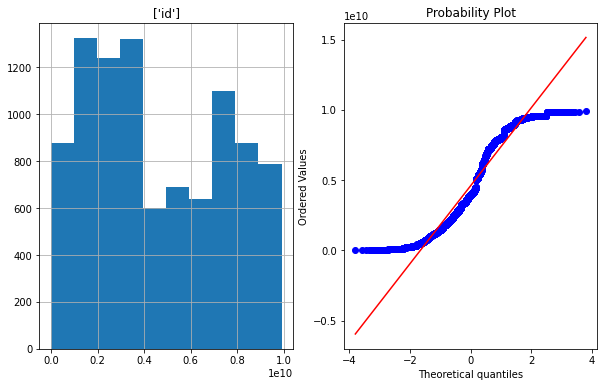

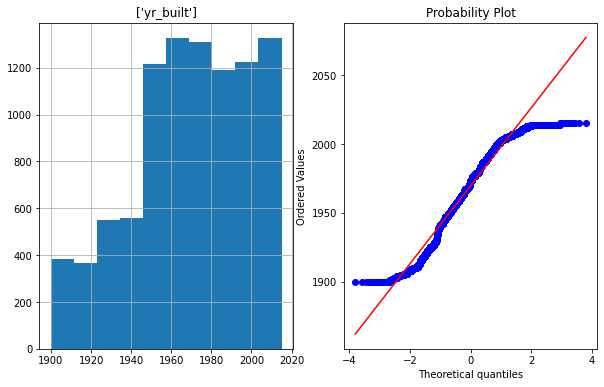

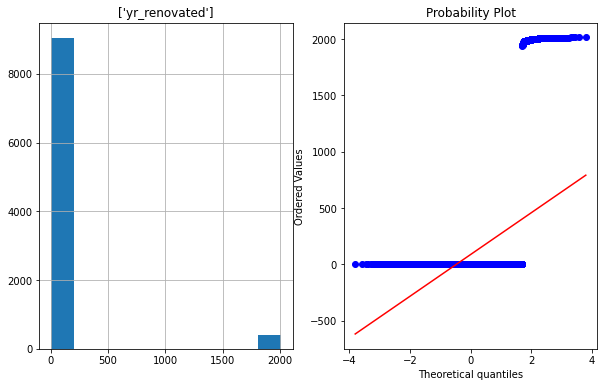

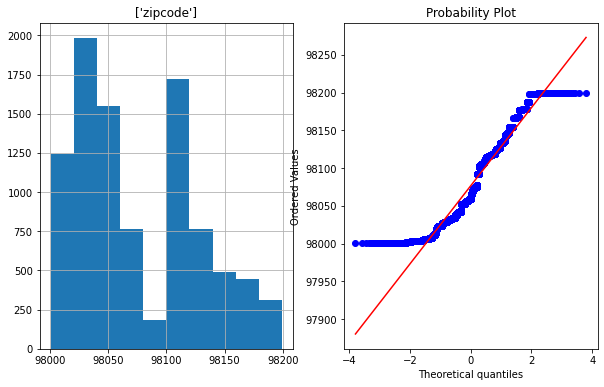

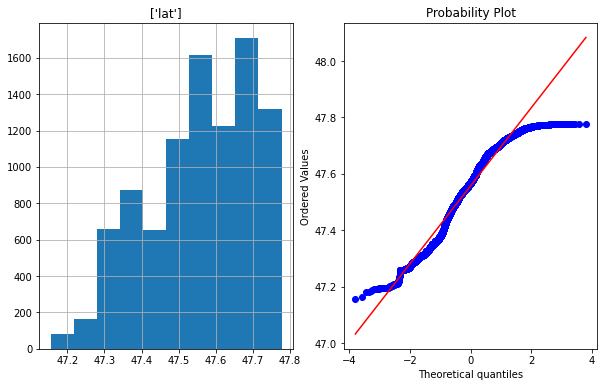

...

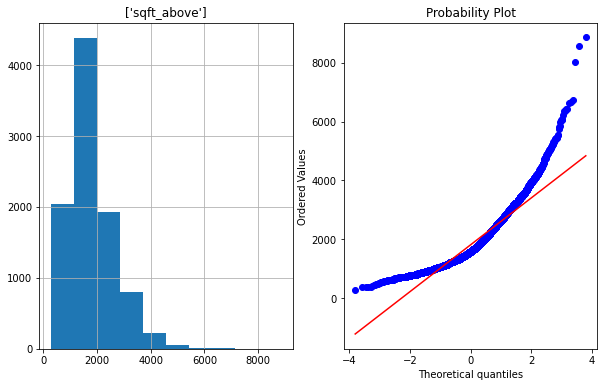

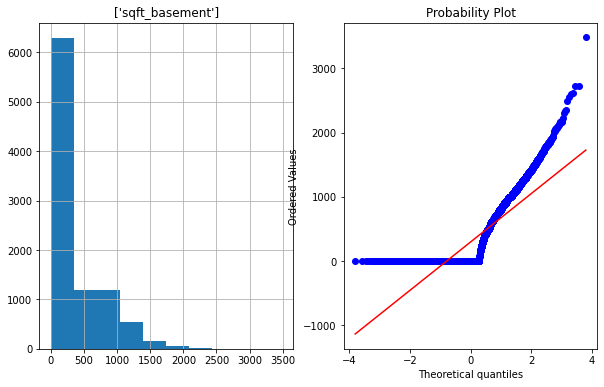

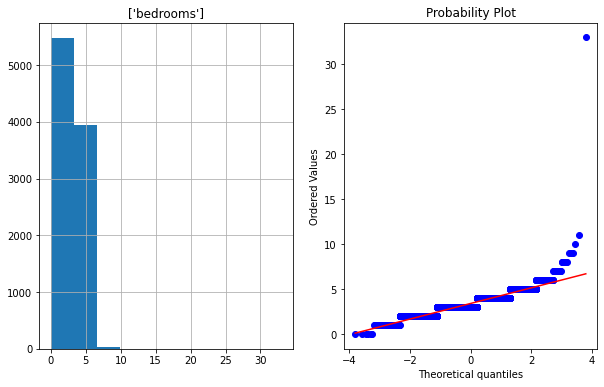

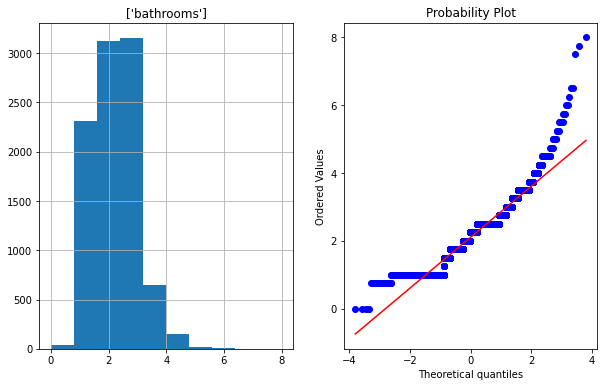

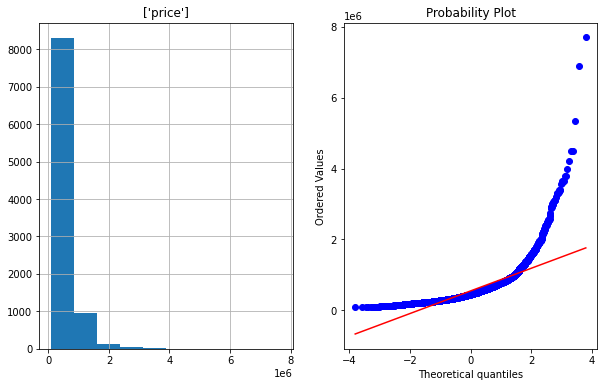

In [18]:
QQ_plot(h1,["id","yr_built","yr_renovated","zipcode","lat","long",
            "condition","waterfront","grade","view","floors","sqft_living","sqft_above","sqft_basement",
            "bedrooms","bathrooms","price"])

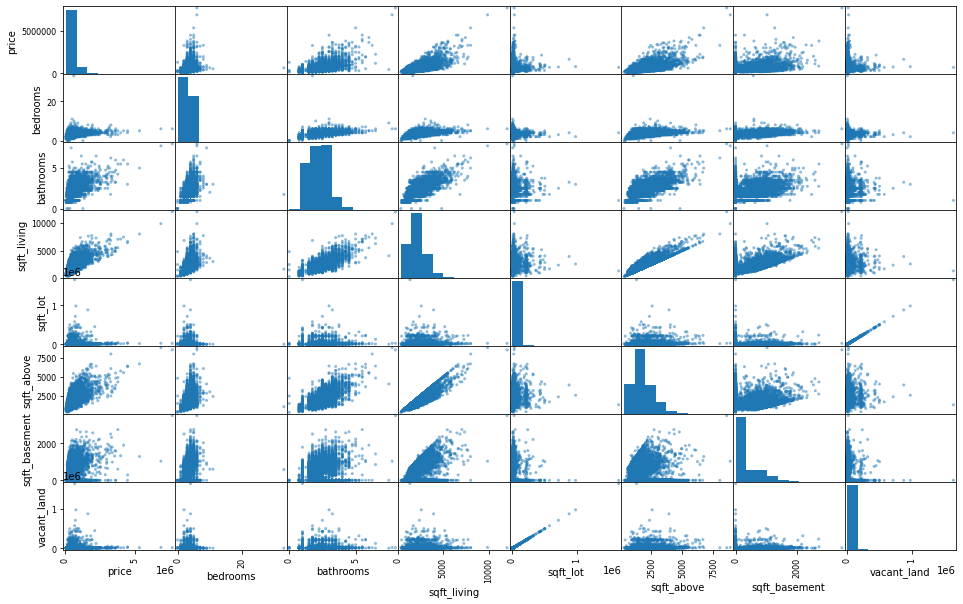

In [19]:
#Pairwise Scatterplot

from pandas.plotting import scatter_matrix
scatter_matrix(h1.drop(["id","date","yr_built","yr_renovated","zipcode","lat","long",
                        "condition","waterfront","grade","view","floors"],axis =1), alpha =0.5 , 
                figsize = (16,10),diagonal = "hist")
plt.show()


In [20]:
fig =px.scatter_3d(h1, x = h1.bedrooms, y = h1.sqft_living, z = h1.price, color = h1.price,
                  width = 950, height = 700)
fig.show()

In [21]:
# trying to get the mean price in the particular zipcodes

# top 20 zipcodes with the highest house prices


price_mean = h1[["zipcode","price"]].groupby("zipcode").mean()
price_mean.sort_values(by ="price", ascending  = False).head(20)

,price
zipcode,
98039,2.307682e+06
98004,1.443138e+06
98040,1.186892e+06
98112,1.181754e+06
98102,9.914641e+05
98109,9.554443e+05
98119,9.080119e+05
98006,9.007424e+05
98105,8.573750e+05


In [22]:
len(price_mean)
# means there are 70 different zipcodes

70

In [23]:
fig = px.bar(price_mean, y = "price", title = "Mean price by each zipcode")
fig.show()

In [24]:
fig = px.box(price_mean , orientation = "h")
fig.show()

# top 4 values are the outliers

In [25]:
fig = px.box(h1.price , orientation = "h", hover_name = h1.view)
fig.show()

<AxesSubplot:>

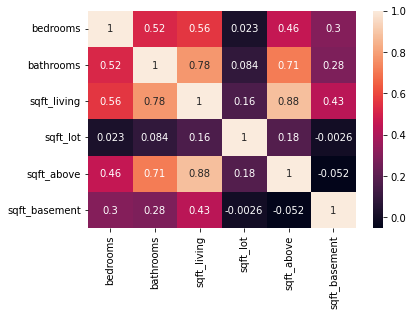

In [26]:
import seaborn as sns
sns.heatmap(h1[["bedrooms","bathrooms","sqft_living","sqft_lot",
                "sqft_above","sqft_basement"]].corr(),annot=True,)

In [27]:
fig = px.scatter(x = h1.sqft_living,y =h1.sqft_above)
fig.show()

In [108]:
fig =px.scatter(h1,x = h1.sqft_living, y = h1.sqft_basement)
fig.show()

In [30]:
fig = px.scatter(h1,x = h1.sqft_lot, y =h1.price , hover_name = h1.zipcode)
fig.show()

# for the top 10 we can say that plot area is less but the price is high so we can count these 
# zipcodes as of higher value

In [31]:
len(set(h1.id)),len(h1.id)

(9412, 9453)

In [32]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Table(header=dict(values=['bedrooms', 'Bathrooms',"Ratio","Price"]),
                 cells=dict(values=[h1.bedrooms,h1.bathrooms, h1.bedrooms/h1.bathrooms,
                                    h1.price])
                              )])
fig.show()

In [33]:
floor_mean = h1[["floors","price"]].groupby("floors").mean()
floor_mean

,price
floors,
1.0,4.396120e+05
1.5,5.763910e+05
2.0,6.628596e+05
2.5,1.337754e+06
3.0,6.914460e+05
3.5,3.300000e+06


In [34]:
# bar graph
fig = px.bar(floor_mean,height = 600, width = 800, opacity = 1)
fig.show()

# hypothesis si true

In [35]:
len(h1.id)

9453

In [36]:
len(set(h1.id))

9412

# Linear regression

In [37]:
from sklearn.model_selection import train_test_split  # for test train split

from sklearn.tree import DecisionTreeClassifier         #for fitting the classification tree

from sklearn.tree import DecisionTreeRegressor          #for fitting regression tree

from sklearn.metrics import  confusion_matrix 

from sklearn import tree                                #for plotting decision tree

from sklearn import metrics

from sklearn.model_selection import cross_val_score

from sklearn.model_selection import KFold, StratifiedKFold

from sklearn.metrics import r2_score,mean_squared_error

from sklearn.linear_model import LinearRegression

from sklearn import linear_model, ensemble

## What Is R-Squared? (Also called as Cofficient of determination)

R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's
explained by an independent variable or variables in a regression model. Whereas correlation explains the strength of the relationship between an independent and dependent variable, R-squared explains to what extent the variance of one variable explains the variance of the second variable


## RMSE

Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). 
Residuals are a measure of how far from the regression line data points are;
RMSE is a measure of how spread out these residuals are. In other words,
it tells you how concentrated the data is around the line of best fit. 
Root mean square error is commonly used in climatology, forecasting, 
#and regression analysis to verify experimental results.

In [39]:
def r2_rmse(X_train, y_train):
    lm = LinearRegression()
    lm.fit(X_train,y_train)
    scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=10)
    print("r2 value: ",scores.mean()) 
    score1 = cross_val_score(lm, X_train, y_train, cv= 10,scoring="neg_mean_squared_error")
    rmse = np.sqrt(-score1.mean())
    print(f'rmse= {"{:.2f}".format(rmse)}')
    print("intercept values :", lm.intercept_)
    print("cofficient values :",lm.coef_)
    

# predict 1

In [40]:
X = h1[["bedrooms","bathrooms","sqft_living","sqft_lot","floors","zipcode"]]

In [41]:
y = h1.price

In [42]:
X_train, X_test, y_train, y_test= train_test_split(X , y , test_size = 0.3 , random_state = 0)

In [43]:
r2_rmse(X_train, y_train)

r2 value:  0.4948920069428112
rmse= 265048.69
intercept values : -52469096.08703787
cofficient values : [-5.07504715e+04 -1.05931001e+03  3.22564507e+02 -1.28195279e-01
 -7.45710403e+03  5.35497995e+02]


# predict 2

In [44]:
X1 = h1[["bedrooms","bathrooms","sqft_living"]]

In [45]:
y = h1.price

In [46]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1 , y , test_size = 0.3 , random_state = 0)

In [47]:
r2_rmse(X_train1, y_train1)

r2 value:  0.49109347600056485
rmse= 266059.48
intercept values : 61454.93151254463
cofficient values : [-50584.22953934  -8899.64650829    318.94058913]


# predict 3

In [48]:
X2 = h1[["sqft_basement","sqft_lot","sqft_living","sqft_above","view","zipcode"]]

In [49]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2 , y , test_size = 0.3 , random_state = 0)

In [50]:
r2_rmse(X_train2, y_train2)

r2 value:  0.5339959081624314
rmse= 255165.59
intercept values : -37106748.58206669
cofficient values : [ 6.98077980e+01 -2.08047789e-01  1.71298251e+02  1.01490453e+02
  1.07177206e+05  3.77878358e+02]


# predict 4

In [51]:
X3 = h1[["sqft_lot","sqft_living","sqft_above","grade","condition","yr_built"]]
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3 , y , test_size = 0.3 , random_state = 0)
r2_rmse(X_train3, y_train3)

r2 value:  0.6015981041543306
rmse= 236668.00
intercept values : 6673245.665211666
cofficient values : [-6.32466616e-02  1.88737325e+02 -1.53757410e+00  1.41865538e+05
  1.48935363e+04 -3.88919040e+03]


# predict 5

In [52]:
X4 = h1[["lat","long","waterfront","view","sqft_living","yr_built"]]
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4 , y , test_size = 0.3 , random_state = 0)
r2_rmse(X_train4, y_train4)

r2 value:  0.6276638500310053
rmse= 228169.03
intercept values : -39878710.2143398
cofficient values : [ 6.35734288e+05 -1.01717523e+05  4.78910371e+05  7.22264165e+04
  2.78226199e+02 -1.44782194e+03]


# Feature Tranformation and Generation


**Feature transformation** is the process of modifying your data but keeping the information. These modifications will make Machine Learning algorithms understanding easier, which will deliver better results.

**Feature generation** is the process of creating new features from one or multiple existing features, potentially for use in statistical analysis. This process adds new information to be accessible during the model construction and therefore hopefully result in a more accurate model

### Created extra column Age

In [53]:
import datetime

currentDateTime = datetime.datetime.now()
date = currentDateTime.date()
year = date.strftime("%Y")

h1["age"] = int(year) - h1.yr_built

In [54]:
h1.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'vacant_land', 'age'],
      dtype='object')

## Standardization ( Why standardization? )


Standardization comes into picture when features of input data set have large differences between their ranges, or simply when they are measured in different measurement units (e.g., Pounds, Meters, Miles … etc).

We try to bring all the variables or features to a similar scale. standarisation means centering the variable at zero. z=(x-x_mean)/std

In [55]:
#### standarisation: We use the Standardscaler from sklearn library
from sklearn.preprocessing import StandardScaler

In [56]:
def std(X_train,X_test,y_train,y_test):   
    
    scaler=StandardScaler()
    ### fit the model
    ## forst we fit the mmodel then we tranform it
    X_train_scaled=scaler.fit_transform(X_train)
    # why not .fit_tranform
    # because it will autommatically takes the value for X_test as given in the y_test
    X_test_scaled=scaler.transform(X_test)
    y_train_scaled = (y_train - y_train.mean())/y_train.std()
    y_test_scaled = (y_test - y_test.mean())/y_test.std()
    return r2_rmse(X_train_scaled, y_train_scaled)



In [57]:
X = h1[["bedrooms","bathrooms","sqft_living","sqft_lot","floors","zipcode"]]
y = h1.price
X_train, X_test, y_train, y_test= train_test_split(X , y , test_size = 0.3 , random_state = 0)

In [58]:
std(X_train, X_test, y_train, y_test)

r2 value:  0.49489200694280466
rmse= 0.70
intercept values : -4.815461400275665e-15
cofficient values : [-0.13098796 -0.00218997  0.79750061 -0.01501749 -0.00995296  0.07581457]


In [59]:
X1 = h1[["bedrooms","bathrooms","sqft_living"]]
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1 , y , test_size = 0.3 , random_state = 0)
std(X_train1, X_test1, y_train1, y_test1)


r2 value:  0.49109347600057074
rmse= 0.71
intercept values : 1.2309592005316231e-17
cofficient values : [-0.13055889 -0.01839877  0.78854092]


In [60]:
X2 = h1[["sqft_basement","sqft_lot","sqft_living","sqft_above","view","zipcode"]]
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2 , y , test_size = 0.3 , random_state = 0)
std(X_train2, X_test2, y_train2, y_test2)

r2 value:  0.5340361324864553
rmse= 0.68
intercept values : -1.4240892787349926e-05
cofficient values : [ 1.32780522e+11 -2.43835449e-02 -2.78038482e+11  2.51019655e+11
  2.24334717e-01  5.34439087e-02]


In [61]:
X3 = h1[["sqft_lot","sqft_living","sqft_above","grade","condition","yr_built"]]
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3 , y , test_size = 0.3 , random_state = 0)
std(X_train3, X_test3, y_train3, y_test3)

r2 value:  0.6015981041543215
rmse= 0.63
intercept values : 7.613860108874507e-17
cofficient values : [-0.00740906  0.46662955 -0.00343205  0.45220988  0.0256638  -0.29807058]


In [62]:
X4 = h1[["lat","long","waterfront","view","sqft_living","yr_built"]]
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4 , y , test_size = 0.3 , random_state = 0)
std(X_train4, X_test4, y_train4, y_test4 )

r2 value:  0.6276638500310072
rmse= 0.61
intercept values : -2.1033413882592765e-14
cofficient values : [ 0.23841137 -0.03816852  0.12143667  0.15120403  0.68787966 -0.1109622 ]


## Guassian Transformation

Some machine learning algorithms linear assume that the features are normally distributed -Accuracy -Performance

- logarithmic transformation
- reciprocal transformation
- square root transformation
- exponential transformation (more general, you can use any exponent)

In [63]:
h2 = h1.copy()

In [64]:
h2.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,vacant_land,age
0,9900000190,20141030T000000,268950,3,1.00,1320,8100,1.0,0,0,...,6,880,440,1943,0,98166,47.4697,-122.351,6780,78
2,9842300485,20150311T000000,380000,2,1.00,1040,7372,1.0,0,0,...,7,840,200,1939,0,98126,47.5285,-122.378,6332,82
3,9839301060,20150406T000000,650500,3,1.75,1740,4400,1.5,0,0,...,8,1740,0,1903,0,98122,47.6115,-122.292,2660,118
4,9839301055,20140626T000000,670000,3,1.50,1490,4400,1.5,0,0,...,7,1490,0,1906,0,98122,47.6113,-122.292,2910,115
5,9839300285,20150412T000000,720000,3,2.50,2100,2200,2.0,0,0,...,7,1500,600,1919,0,98122,47.6140,-122.294,100,102


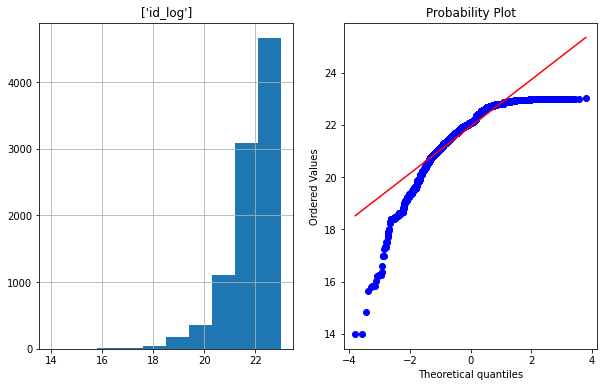

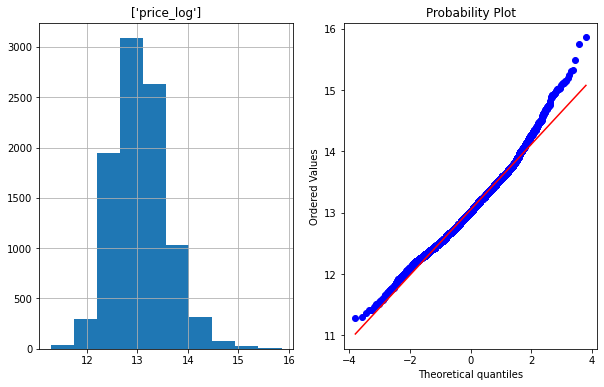

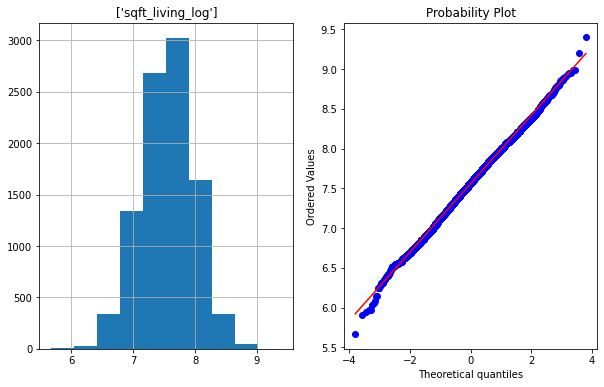

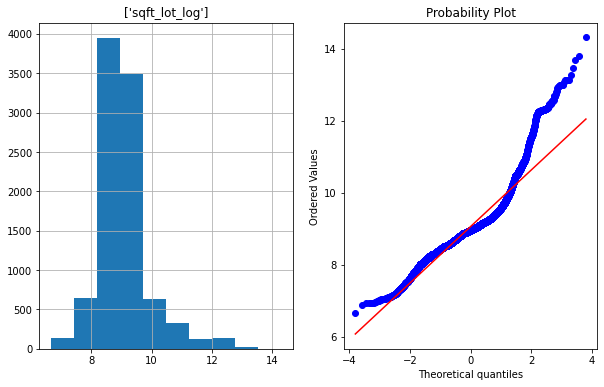

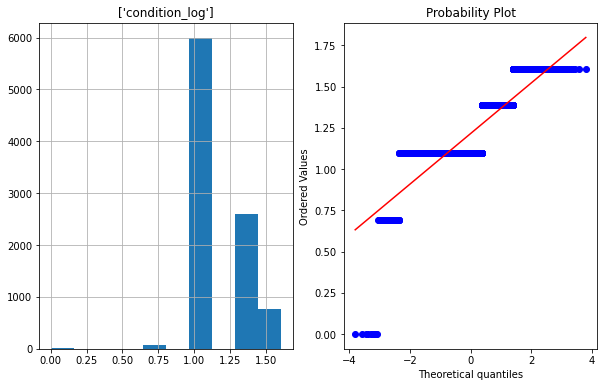

...

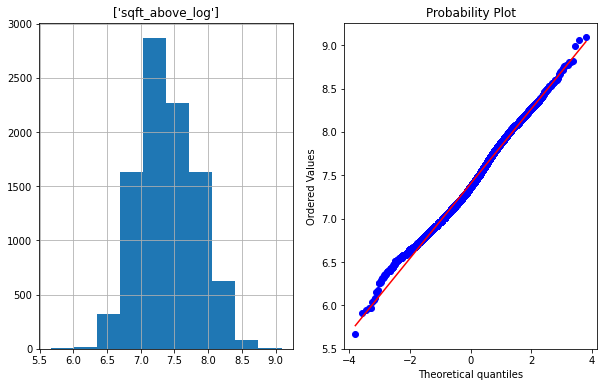

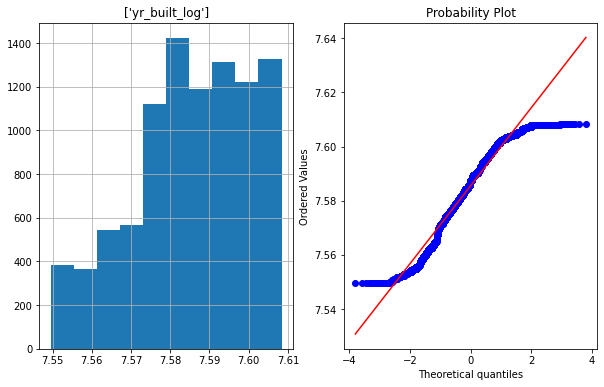

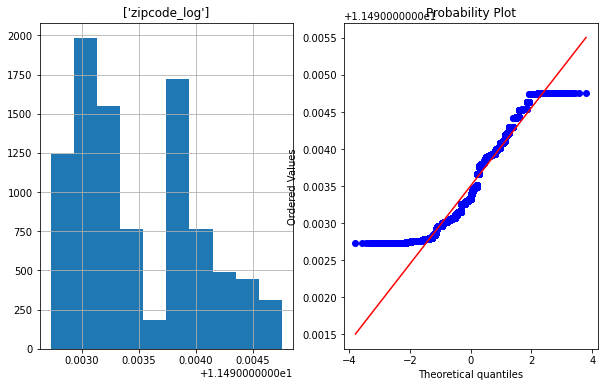

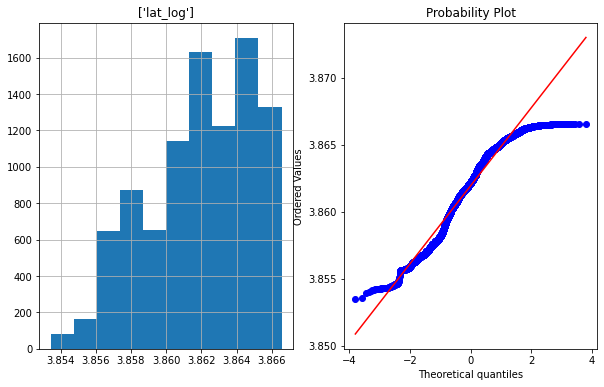

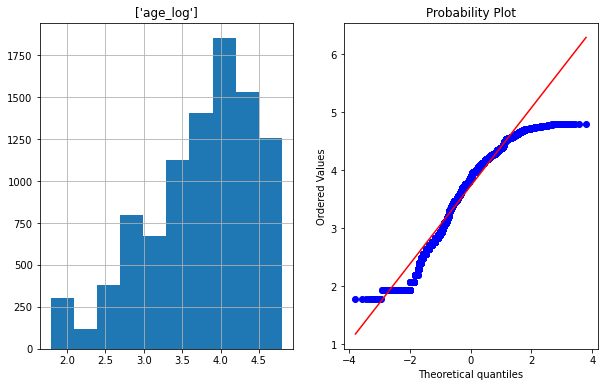

In [65]:
# logarithmic transformation

h2["id_log"] = np.log(h2["id"])
QQ_plot(h2,["id_log"])

h2["price_log"] = np.log(h2["price"])
QQ_plot(h2,["price_log"])

h2["sqft_living_log"] = np.log(h2["sqft_living"])
QQ_plot(h2,["sqft_living_log"])

h2["sqft_lot_log"] = np.log(h2["sqft_lot"])
QQ_plot(h2,["sqft_lot_log"])

h2["condition_log"] = np.log(h2["condition"])
QQ_plot(h2,["condition_log"])

h2["floors_log"] = np.log(h2["floors"])
QQ_plot(h2,["floors_log"])

h2["sqft_above_log"] = np.log(h2["sqft_above"])
QQ_plot(h2,["sqft_above_log"])

h2["yr_built_log"] = np.log(h2["yr_built"])
QQ_plot(h2,["yr_built_log"])

h2["zipcode_log"] = np.log(h2["zipcode"])
QQ_plot(h2,["zipcode_log"])

h2["lat_log"] = np.log(h2["lat"])
QQ_plot(h2,["lat_log"])

h2["age_log"] = np.log(h2["age"])
QQ_plot(h2,["age_log"])

In [66]:
h2 = h1.copy()

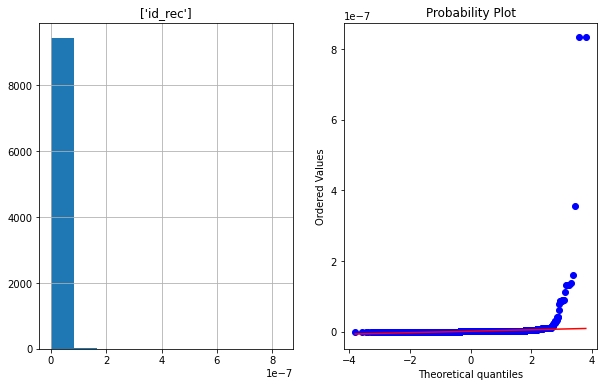

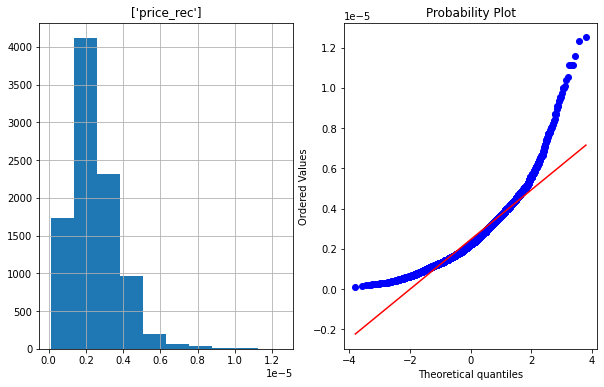

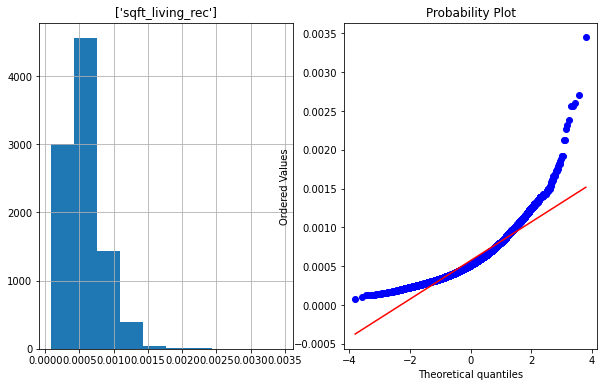

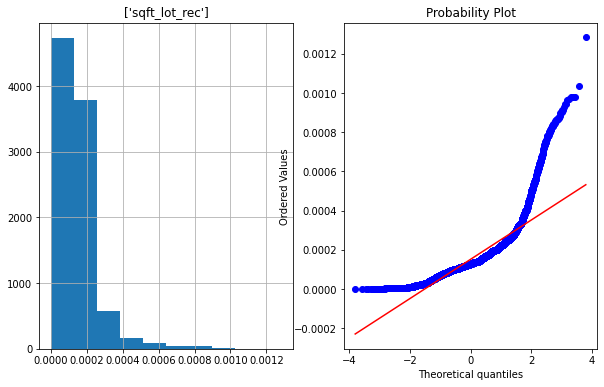

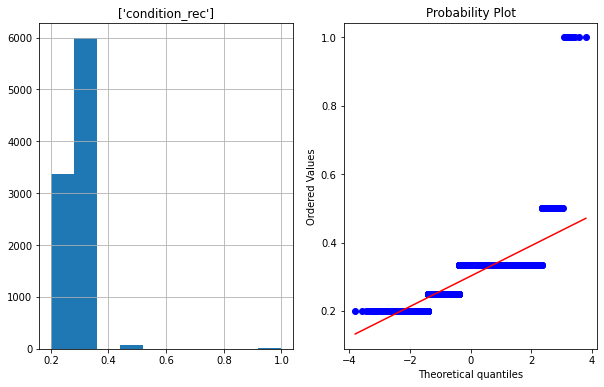

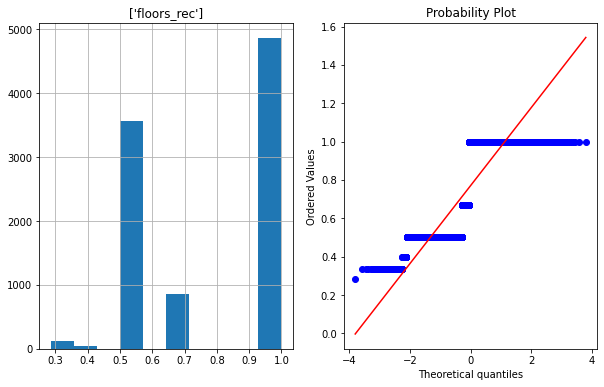

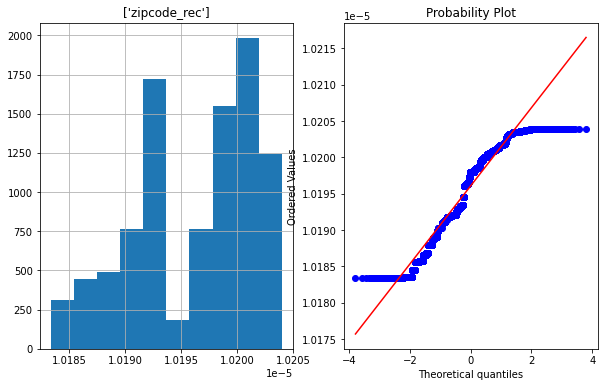

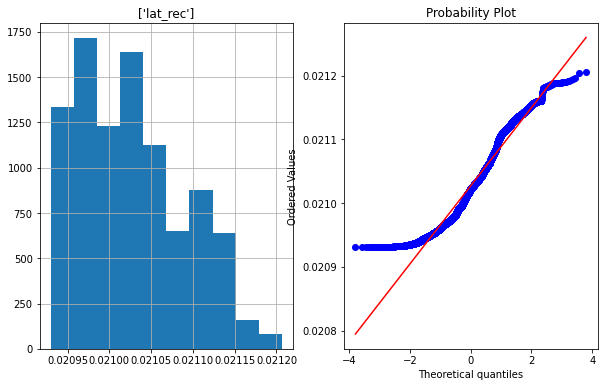

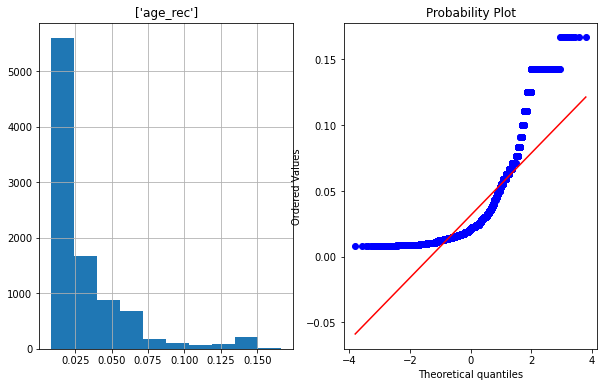

In [67]:
# Reciprocal Trnasformation


h2["id_rec"] = 1/h2.id
QQ_plot(h2,["id_rec"])

h2["price_rec"] = 1/h2["price"]
QQ_plot(h2,["price_rec"])

h2["sqft_living_rec"] = 1/h2["sqft_living"]
QQ_plot(h2,["sqft_living_rec"])

h2["sqft_lot_rec"] = 1/h2["sqft_lot"]
QQ_plot(h2,["sqft_lot_rec"])

h2["condition_rec"] = 1/h2["condition"]
QQ_plot(h2,["condition_rec"])

h2["floors_rec"] = 1/h2["floors"]
QQ_plot(h2,["floors_rec"])

h2["zipcode_rec"] = 1/h2["zipcode"]
QQ_plot(h2,["zipcode_rec"])

h2["lat_rec"] = 1/h2["lat"]
QQ_plot(h2,["lat_rec"])

h2["age_rec"] = 1/h2["age"]
QQ_plot(h2,["age_rec"])


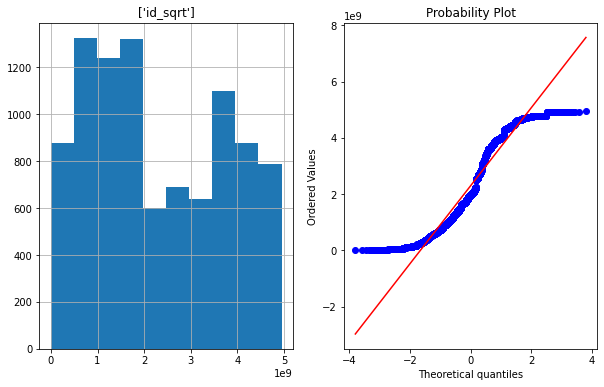

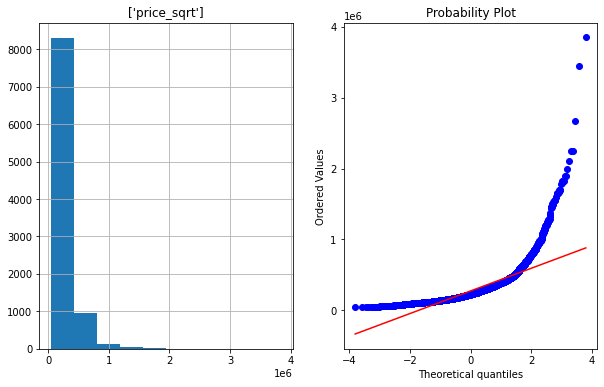

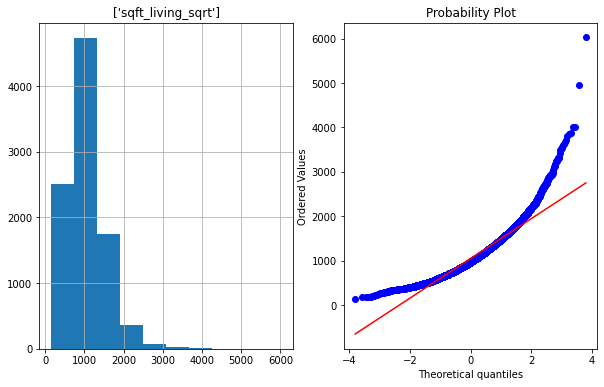

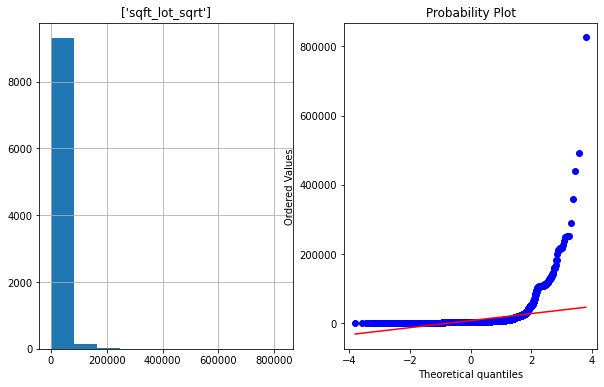

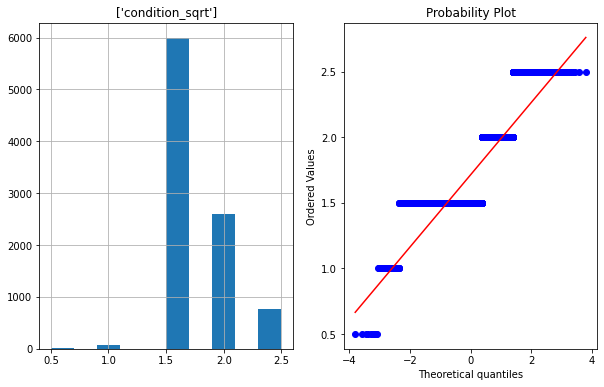

...

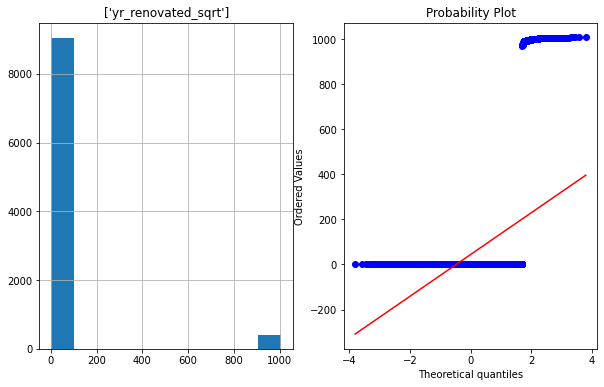

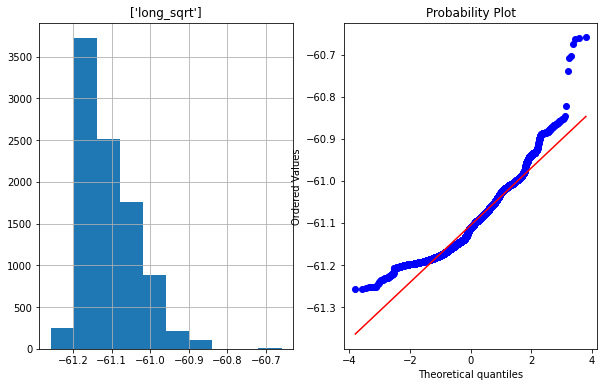

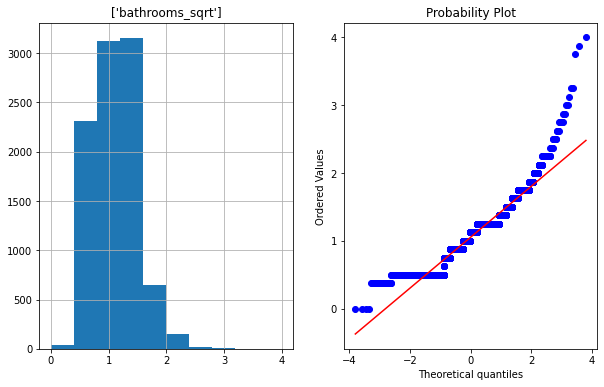

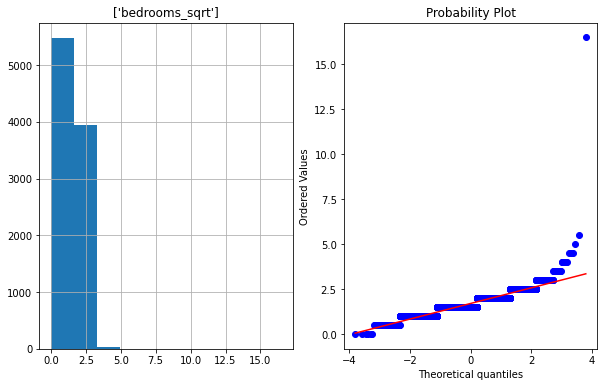

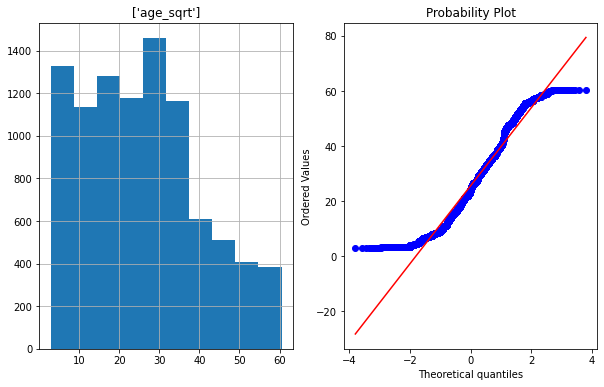

In [68]:
##### Square Root Transformation

h2["id_sqrt"] = h2["id"]**1/2
QQ_plot(h2,["id_sqrt"])

h2["price_sqrt"] = h2["price"]**1/2
QQ_plot(h2,["price_sqrt"])

h2["sqft_living_sqrt"] = h2["sqft_living"]**1/2
QQ_plot(h2,["sqft_living_sqrt"])

h2["sqft_lot_sqrt"] = h2["sqft_lot"]**1/2
QQ_plot(h2,["sqft_lot_sqrt"])

h2["condition_sqrt"] = h2["condition"]**1/2
QQ_plot(h2,["condition_sqrt"])

h2["floors_sqrt"] = h2["floors"]**1/2
QQ_plot(h2,["floors_sqrt"])

h2["zipcode_sqrt"] = h2["zipcode"]**1/2
QQ_plot(h2,["zipcode_sqrt"])

h2["lat_sqrt"] = h2["lat"]**1/2
QQ_plot(h2,["lat_sqrt"])

h2["view_sqrt"] = h2["view"]**1/2
QQ_plot(h2,["view_sqrt"])

h2["grade_sqrt"] = h2["grade"]**1/2
QQ_plot(h2,["grade_sqrt"])

h2["yr_built_sqrt"] = h2["yr_built"]**1/2
QQ_plot(h2,["yr_built_sqrt"])

h2["sqft_basement_sqrt"] = h2["sqft_basement"]**1/2
QQ_plot(h2,["sqft_basement_sqrt"])

h2["yr_renovated_sqrt"] = h2["yr_renovated"]**1/2
QQ_plot(h2,["yr_renovated_sqrt"])

h2["long_sqrt"] = h2["long"]**1/2
QQ_plot(h2,["long_sqrt"])

h2["bathrooms_sqrt"] = h2["bathrooms"]**1/2
QQ_plot(h2,["bathrooms_sqrt"])

h2["bedrooms_sqrt"] = h2["bedrooms"]**1/2
QQ_plot(h2,["bedrooms_sqrt"])

h2["age_sqrt"] = h2["age"]**1/2
QQ_plot(h2,["age_sqrt"])

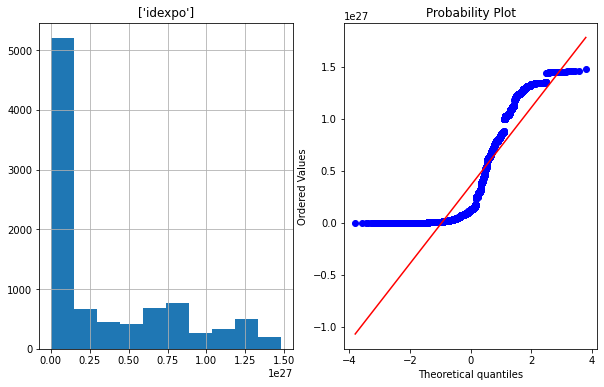

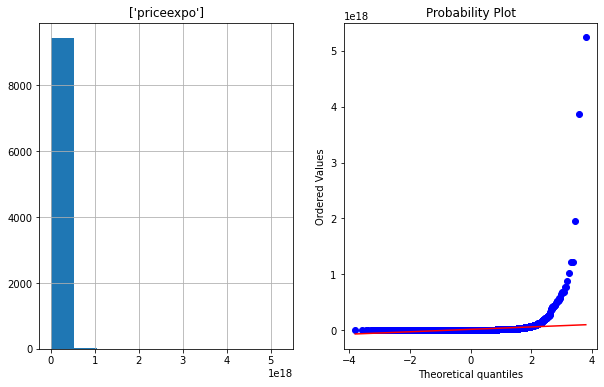

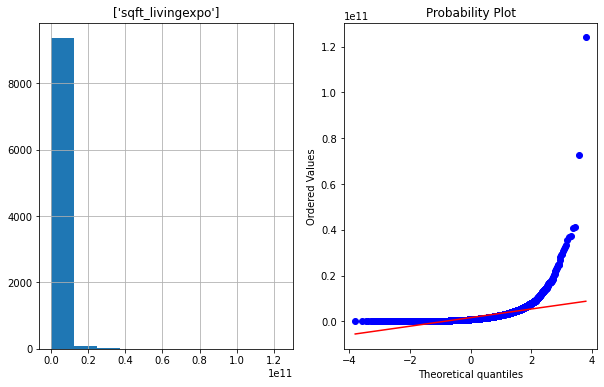

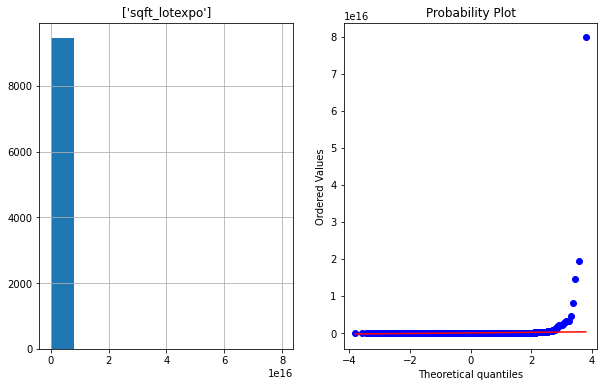

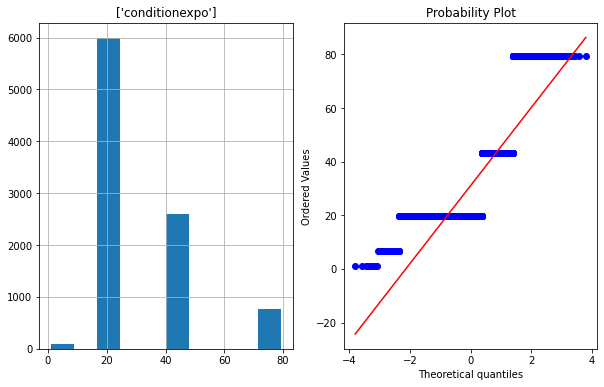

...

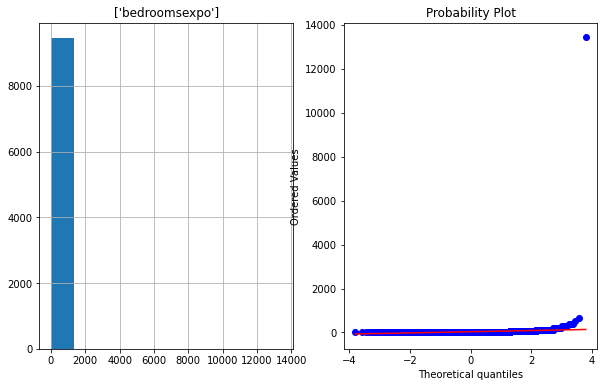

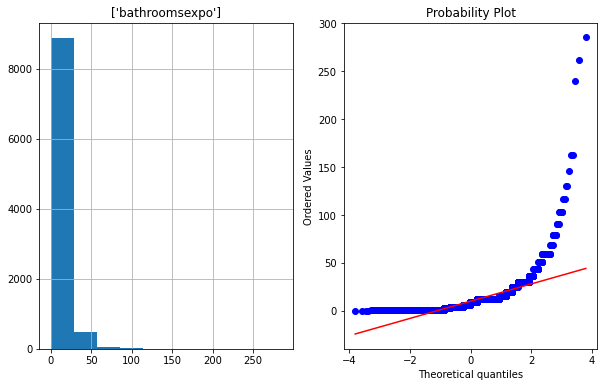

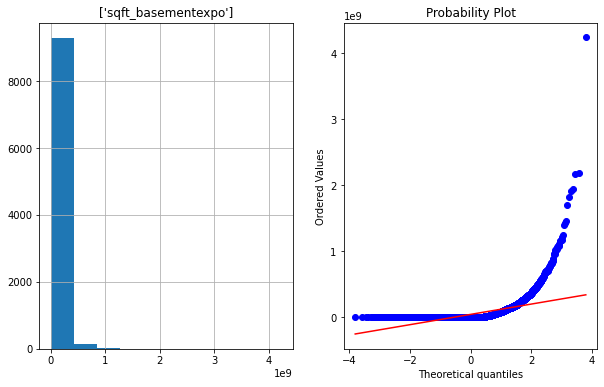

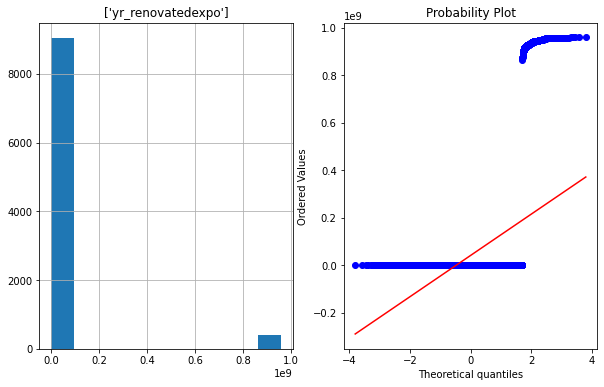

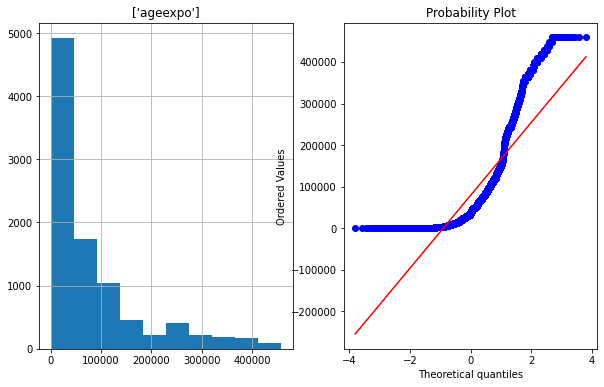

In [69]:
#### Exponential Transdormation

col_list = ["id","price","sqft_living","sqft_lot","condition","view","floors","grade"
            ,"sqft_above","yr_built","zipcode", "lat","long","bedrooms","bathrooms","sqft_basement","yr_renovated","age"]

for i in col_list:
    
    h2[i+"expo"] = h2[i]**(2.7182818284590452353602874713527)
    
    QQ_plot(h2,[i+"expo"])


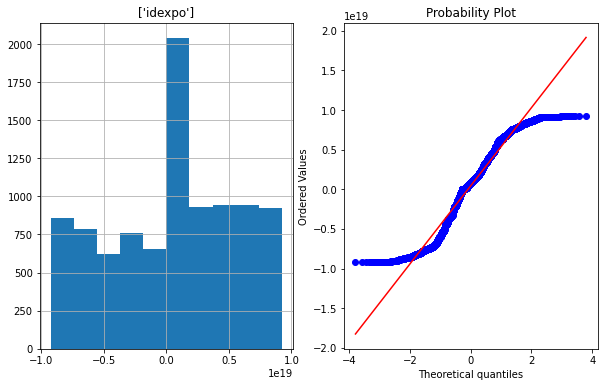

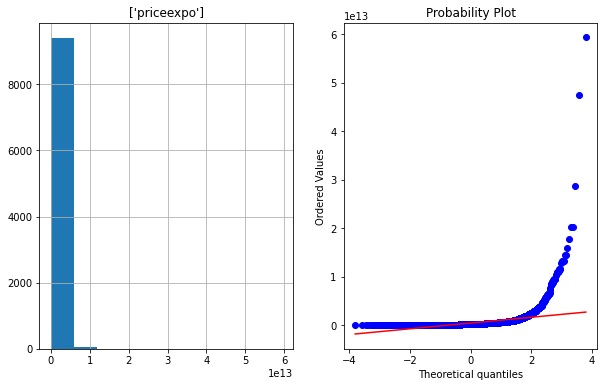

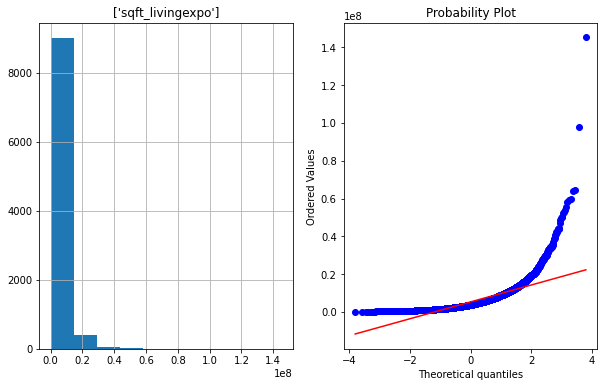

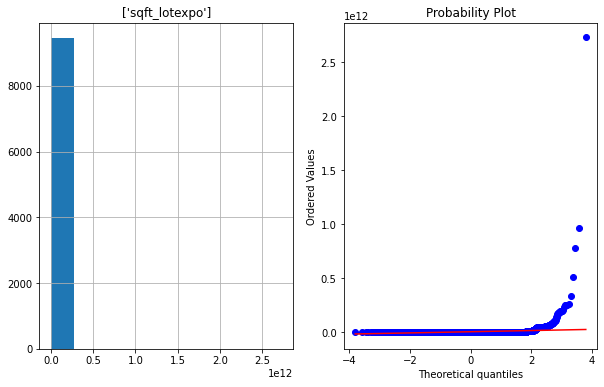

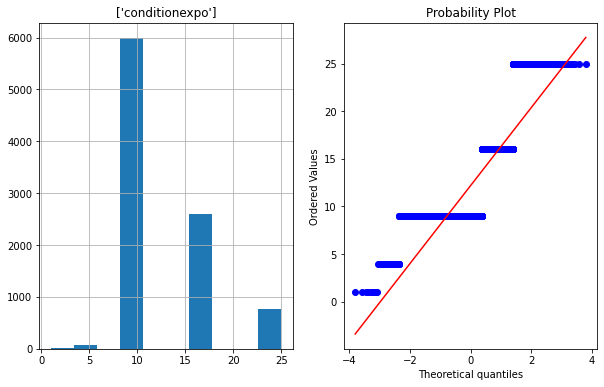

...

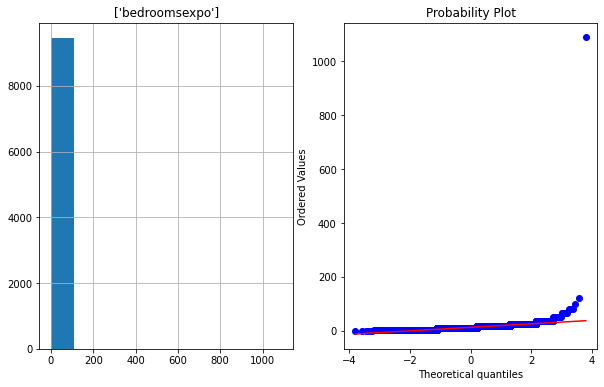

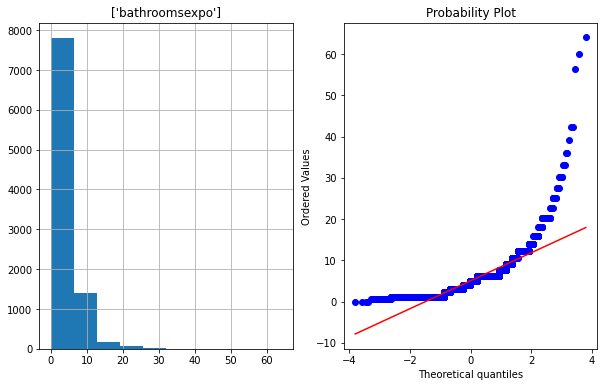

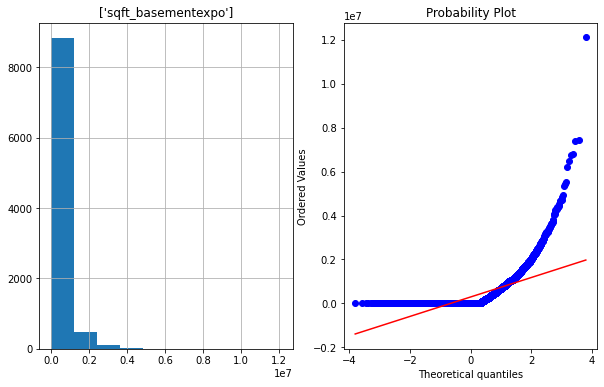

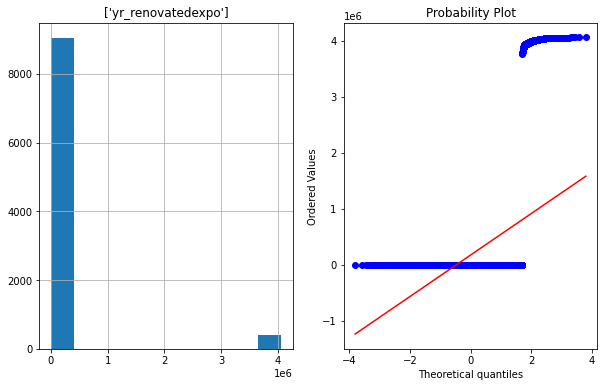

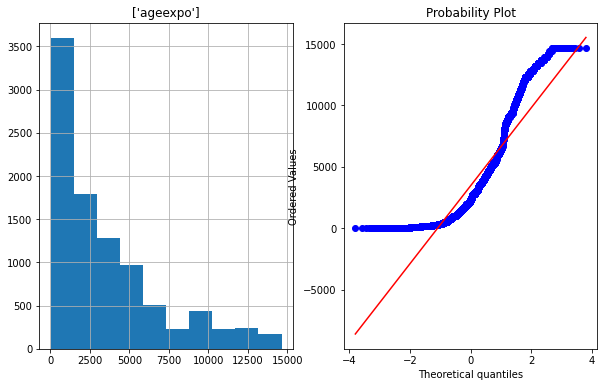

In [70]:
## square tranformation

col_list = ["id","price","sqft_living","sqft_lot","condition","view","floors","grade"
            ,"sqft_above","yr_built","zipcode", "lat","long","bedrooms","bathrooms","sqft_basement","yr_renovated","age"]

for i in col_list:
    
    h2[i+"expo"] = h2[i]**2
    
    QQ_plot(h2,[i+"expo"])


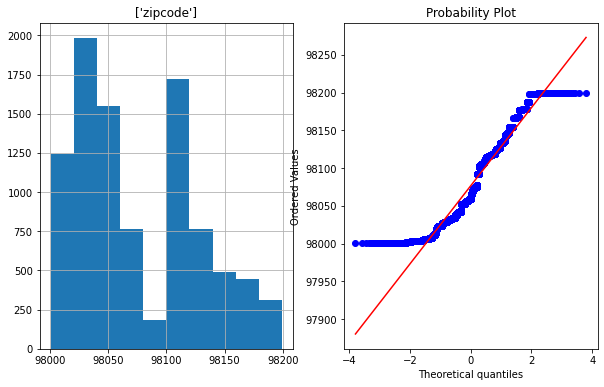

In [71]:
QQ_plot(h1,["zipcode"])

In [72]:
h2 = h1.copy()

## Transforming the data

In [73]:
# we are now tranforming the values of columns so that it can best form normal distrbution

# log transformation

h2[["price","sqft_living","sqft_above"]] = np.log(h2[["price","sqft_living","sqft_above"]])

# reciprocal tranformation

h2[["id"]] = 1/h2[["id"]]

# square root teanformation

h2[["grade","long","bedrooms"]] = h2[["grade","long","bedrooms"]]**1/2

# exponential tranformation

h2[["sqft_basement"]] = h2[["sqft_basement"]]**(2.7182818284590452353602874713527)

# square tranformation

h2[["sqft_lot"]] = h2[["sqft_lot"]]**2


In [74]:
h2.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,vacant_land,age
0,1.010101e-10,20141030T000000,12.502281,1.5,1.00,7.185387,65610000,1.0,0,0,...,3.0,6.779922,1.533379e+07,1943,0,98166,47.4697,-61.1755,6780,78
2,1.016023e-10,20150311T000000,12.847927,1.0,1.00,6.946976,54346384,1.0,0,0,...,3.5,6.733402,1.798242e+06,1939,0,98126,47.5285,-61.1890,6332,82
3,1.016332e-10,20150406T000000,13.385497,1.5,1.75,7.461640,19360000,1.5,0,0,...,4.0,7.461640,0.000000e+00,1903,0,98122,47.6115,-61.1460,2660,118
4,1.016332e-10,20140626T000000,13.415033,1.5,1.50,7.306531,19360000,1.5,0,0,...,3.5,7.306531,0.000000e+00,1906,0,98122,47.6113,-61.1460,2910,115
5,1.016332e-10,20150412T000000,13.487006,1.5,2.50,7.649693,4840000,2.0,0,0,...,3.5,7.313220,3.562854e+07,1919,0,98122,47.6140,-61.1470,100,102


## After tranforming calculating R2

In [105]:
X4 = h2[["lat","long","view","sqft_living","yr_built"]]

y = h2.price

X_train4, X_test4, y_train4, y_test4 = train_test_split(X4 , y , test_size = 0.3 , random_state = 0)

r2_rmse(X_train4, y_train4)

r2 value:  0.6797165600280188
rmse= 0.30
intercept values : -62.26682119258112
cofficient values : [ 1.50031045 -0.0143112   0.13059706  0.80775457 -0.00154871]


In [80]:
X5 = h2[["sqft_living","sqft_lot","age","condition","sqft_basement","lat","long","view"]]

X_train5, X_test5, y_train5, y_test5 = train_test_split(X5 , y , test_size = 0.3 , random_state = 0)

r2_rmse(X_train5, y_train5)


r2 value:  0.6730640024690505
rmse= 0.30
intercept values : -69.83934140656325
cofficient values : [ 8.23347056e-01  5.05892675e-13  1.28306951e-03  3.99374090e-02
 -1.65916224e-10  1.52480055e+00 -6.41088014e-02  1.31401404e-01]


In [81]:
X6 = h2[["sqft_living","bedrooms","bathrooms","sqft_basement","lat","long","view","grade"]]

X_train6, X_test6, y_train6, y_test6 = train_test_split(X6 , y , test_size = 0.3 , random_state = 0)

r2_rmse(X_train6, y_train6)


r2 value:  0.7316799724572911
rmse= 0.27
intercept values : -82.55415128696839
cofficient values : [ 4.30811899e-01 -1.85081984e-02  1.43253334e-02  4.81750438e-11
  1.43466474e+00 -3.73877329e-01  1.16284334e-01  3.24017828e-01]


In [82]:
X7 = h2[["sqft_living","sqft_basement","bedrooms","floors","age","grade","view","lat","long"]]

X_train7, X_test7, y_train7, y_test7= train_test_split(X7 , y , test_size = 0.3 , random_state = 0)

r2_rmse(X_train7, y_train7)

r2 value:  0.7575736735846835
rmse= 0.26
intercept values : -47.45291880567271
cofficient values : [ 4.52434130e-01  2.87312881e-11 -2.05581964e-02  6.55648885e-02
  3.90240879e-03  3.82687735e-01  9.93497652e-02  1.28952867e+00
  9.81505912e-02]


# FORWARD SELECTION

In [83]:
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

In [84]:
lreg = LinearRegression()
sfs1 = sfs(lreg, k_features=4, forward=True, verbose=2, scoring='neg_mean_squared_error')

In [85]:
X = h2[["id","sqft_living","sqft_lot","condition","view","floors","grade"
        ,"sqft_above","yr_built","zipcode", "lat","long","bedrooms","bathrooms","sqft_basement","yr_renovated","age"]]
y = h2.price

In [86]:
sfs1 = sfs1.fit(X, y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  17 out of  17 | elapsed:    0.5s finished

[2021-11-09 23:01:09] Features: 1/4 -- score: -0.1431336348590912[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  16 out of  16 | elapsed:    0.4s finished

[2021-11-09 23:01:09] Features: 2/4 -- score: -0.10259357904684654[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:    0.5s finished

[2021-11-09 23:01:10] Features: 3/4 -- score: -0.08579334031145533[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done

In [87]:
feat_names = list(sfs1.k_feature_names_)
print(feat_names)

['sqft_living', 'grade', 'lat', 'age']


In [88]:
X = h2[['sqft_living', 'grade', 'view', 'lat']]
y = h2.price
X_train, X_test, y_train, y_test = train_test_split(X , y , test_size = 0.3 , random_state = 0)

r2_rmse(X_train, y_train)


r2 value:  0.7302763863783741
rmse= 0.28
intercept values : -60.812367470831234
cofficient values : [0.42545604 0.32415603 0.12370224 1.45870461]


# BACKWARD ELIMINATION

In [89]:
lreg1 = LinearRegression()

sfs1 = sfs(lreg1, k_features=4, forward=False, verbose=1, scoring='neg_mean_squared_error')

In [90]:
sfs1 = sfs1.fit(X, y)

In [91]:
feat_names = list(sfs1.k_feature_names_)
print(feat_names)

['sqft_living', 'grade', 'view', 'lat']


In [92]:
X_train, X_test, y_train, y_test = train_test_split(X , y , test_size = 0.33 , random_state = 0)

r2_rmse(X_train, y_train)

r2 value:  0.7301315860216039
rmse= 0.28
intercept values : -60.91311393842742
cofficient values : [0.42589115 0.3230173  0.12309903 1.4608269 ]


# DECISION TREE

## Prediction 1

In [106]:
X7 = h2[["sqft_living","sqft_basement","bedrooms","floors","age","grade","view","lat","long"]]

y = h2.price

X_train7, X_test7, y_train7, y_test7= train_test_split(X7 , y , test_size = 0.3 , random_state = 0)


In [94]:
model = DecisionTreeRegressor(max_depth = 3 , min_samples_leaf = 5)

model.fit(X_train7 , y_train7)

DecisionTreeRegressor(max_depth=3, min_samples_leaf=5)

In [95]:
test_data_prediction = model.predict(X_test7)
test_data_prediction

array([13.5350523 , 12.92539734, 13.26052905, ..., 13.26052905,
       12.92539734, 12.92539734])

In [96]:
error_score = metrics.r2_score(y_test7, test_data_prediction)

print("R squared : ", error_score)

R squared :  0.6766840512842021


## Prediction 2

In [97]:
X = h2[["sqft_above","sqft_lot","grade"
        ,"yr_built", "lat","long","bedrooms","sqft_basement","age"]]

y = h2.price

X_train, X_test, y_train, y_test = train_test_split(X , y , test_size = 0.3 , random_state = 0)

model = DecisionTreeRegressor(max_depth = 5 , min_samples_leaf = 5)

model.fit(X_train , y_train)

test_data_prediction = model.predict(X_test)

error_score = metrics.r2_score(y_test, test_data_prediction)

print("R squared : ", error_score)

R squared :  0.7448660951503789


## Prediction 3

In [98]:
X = h2[["sqft_living","sqft_lot","grade","view","waterfront"
        , "lat","long","bedrooms","sqft_basement","age"]]

y = h2.price

X_train, X_test, y_train, y_test = train_test_split(X , y , test_size = 0.3 , random_state = 0)

model = DecisionTreeRegressor(max_depth = 5 , min_samples_leaf = 5)

model.fit(X_train , y_train)

test_data_prediction = model.predict(X_test)

error_score = metrics.r2_score(y_test, test_data_prediction)

print("R squared : ", error_score)

R squared :  0.7604858059291782


# Model Testing

In [99]:
test = pd.read_excel("testdata.xlsx")

In [100]:
import datetime

currentDateTime = datetime.datetime.now()
date = currentDateTime.date()
year = date.strftime("%Y")

test["age"] = int(year) - test.yr_built

In [101]:
# we are now tranforming the values of columns so that it can best form normal distrbution

# log transformation

test[["price","sqft_living","sqft_above"]] = np.log(test[["price","sqft_living","sqft_above"]])

# reciprocal tranformation

test[["id"]] = 1/test[["id"]]

# square root teanformation

test[["grade","long","bedrooms"]] = test[["grade","long","bedrooms"]]**1/2

# exponential tranformation

test[["sqft_basement"]] = test[["sqft_basement"]]**(2.7182818284590452353602874713527)

# square tranformation

test[["sqft_lot"]] = test[["sqft_lot"]]**2


# Multiple Linear Regression Test 

In [102]:
X = test[["sqft_living","sqft_basement","bedrooms","floors","age","grade","view","lat","long"]]

y = test.price
regressor = LinearRegression()

regressor.fit(X, y)

y_pred = regressor.predict(X)

df = pd.DataFrame({'Real Values':y, 'Predicted Values':y_pred})

r2_rmse(X,y),df


r2 value:  0.7316644005198162
rmse= 0.27
intercept values : -61.097629910074204
cofficient values : [ 5.06635413e-01  5.73633378e-11 -3.69202395e-02  5.77298422e-02
  3.28282676e-03  3.52719860e-01  8.23926447e-02  1.46819450e+00
  1.74191692e-02]


(None,
       Real Values  Predicted Values
 0       12.685408         12.561471
 1       13.180632         13.251550
 2       12.149502         12.472334
 3       13.440817         13.325818
 4       12.388394         12.322986
 ...           ...               ...
 2212    12.911642         12.766860
 2213    12.868761         12.986339
 2214    13.318752         13.126320
 2215    12.345835         12.730030
 2216    12.934828         12.965345
 
 [2217 rows x 2 columns])

# Decision Tree test

In [103]:
X = test[["sqft_living","sqft_lot","grade","view","waterfront", "lat","long","bedrooms","sqft_basement","age"]]

y = test.price

model = DecisionTreeRegressor(max_depth = 5 , min_samples_leaf = 5)
  
# fit the regressor with X and Y data
model.fit(X, y)

test_data_prediction = model.predict(X_test)

error_score = metrics.r2_score(y_test, test_data_prediction)

print("R squared : ", error_score) 

R squared :  0.740971898430069


### Which model is better?

Both the decision tree and linear regression model gives us the same r^2 value, which is our model is accurate upto 74% 
so therefore we can choose any of the model(Decision Tree or Linear Regression)